In [ ]:
!wget http://images.cocodataset.org/zips/train2017.zip -O coco_train2017.zip
!wget http://images.cocodataset.org/zips/val2017.zip -O coco_val2017.zip
!wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip -O coco_ann2017.zip

--2025-03-26 20:14:29--  http://images.cocodataset.org/zips/train2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 3.5.20.192, 3.5.29.191, 16.15.217.151, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|3.5.20.192|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 19336861798 (18G) [application/zip]
Saving to: ‘coco_train2017.zip’

coco_train2017.zip  100%[===================>]  18.01G  55.9MB/s    in 4m 1s   

2025-03-26 20:18:30 (76.6 MB/s) - ‘coco_train2017.zip’ saved [19336861798/19336861798]

--2025-03-26 20:18:30--  http://images.cocodataset.org/zips/val2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 3.5.21.183, 16.182.64.209, 52.216.212.201, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|3.5.21.183|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 815585330 (778M) [application/zip]
Saving to: ‘coco_val2017.zip’

coco_val2017.zip    100%[===================>]

In [ ]:
from zipfile import ZipFile, BadZipFile
import os

def extract_zip_file(extract_path):
    try:
        with ZipFile(extract_path+".zip") as zfile:
            zfile.extractall(extract_path)

        # remove zipfile
        zfileTOremove=f"{extract_path}"+".zip"
        if os.path.isfile(zfileTOremove):
            os.remove(zfileTOremove)
        else:
            print("Error: %s file not found" % zfileTOremove)

    except BadZipFile as e:
        print("Error:", e)


extract_train_path = "./coco_train2017"
extract_val_path = "./coco_val2017"
extract_ann_path="./coco_ann2017"

extract_zip_file(extract_train_path)
extract_zip_file(extract_val_path)
extract_zip_file(extract_ann_path)

In [ ]:
!pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 487.4/487.4 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 183.9/183.9 kB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.5/143.5 kB 8.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.8/194.8 kB 10.7 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2025.3.0
    Uninstalling fsspec-2025.3.0:
      Successfully uninstalled fsspec-2025.3.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2025.3.0 requires fsspec==2025.3.0, but you have fsspec 2024.12.0 which is incompatible.
torch 2.6.0+cu124 requires nvidia-cublas-cu12==12.4.5.8; platform_system == "Linux" and platform_machine == "x86_64", but you have nvidia-cublas-cu12 12.5.3.2 which is 

In [ ]:
from datasets import load_dataset

# Specify paths for images and annotations
data_dir = "/content"  # Set this to the path where your dataset is stored


In [ ]:
from pycocotools.coco import COCO

In [ ]:
ann_file ="/content/coco_ann2017/annotations/instances_train2017.json"

In [ ]:
coco = COCO(ann_file)

loading annotations into memory...
Done (t=34.75s)
creating index...
index created!


In [ ]:
categories = coco.loadCats(coco.getCatIds())

In [ ]:
category_name = [cat['name'] for cat in categories]
print("Categories: \n",category_name)

Categories: 
 ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']


In [ ]:
print("Categories: \n")
for cat in categories:
  category_name = cat['name']
  print(category_name)

Categories: 

person
bicycle
car
motorcycle
airplane
bus
train
truck
boat
traffic light
fire hydrant
stop sign
parking meter
bench
bird
cat
dog
horse
sheep
cow
elephant
bear
zebra
giraffe
backpack
umbrella
handbag
tie
suitcase
frisbee
skis
snowboard
sports ball
kite
baseball bat
baseball glove
skateboard
surfboard
tennis racket
bottle
wine glass
cup
fork
knife
spoon
bowl
banana
apple
sandwich
orange
broccoli
carrot
hot dog
pizza
donut
cake
chair
couch
potted plant
bed
dining table
toilet
tv
laptop
mouse
remote
keyboard
cell phone
microwave
oven
toaster
sink
refrigerator
book
clock
vase
scissors
teddy bear
hair drier
toothbrush


# **Displaying first 5 Images from the COCO dataset**

loading annotations into memory...
Done (t=19.01s)
creating index...
index created!
loading annotations into memory...
Done (t=4.49s)
creating index...
index created!

📸 Captions for Image ID 391895:
  1. A man with a red helmet on a small moped on a dirt road. 
  2. Man riding a motor bike on a dirt road on the countryside.
  3. A man riding on the back of a motorcycle.
  4. A dirt path with a young person on a motor bike rests to the foreground of a verdant area with a bridge and a background of cloud-wreathed mountains. 
  5. A man in a red shirt and a red hat is on a motorcycle on a hill side.


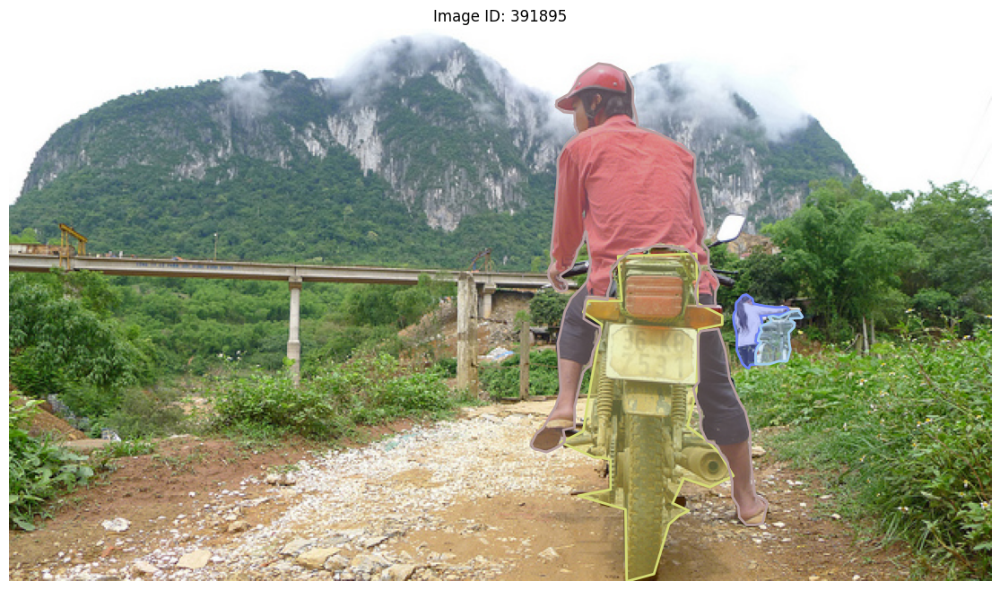


📸 Captions for Image ID 522418:
  1. A woman wearing a net on her head cutting a cake. 
  2. A woman cutting a large white sheet cake.
  3. A woman wearing a hair net cutting a large sheet cake.
  4. there is a woman that is cutting a white cake
  5. A woman marking a cake with the back of a chef's knife. 


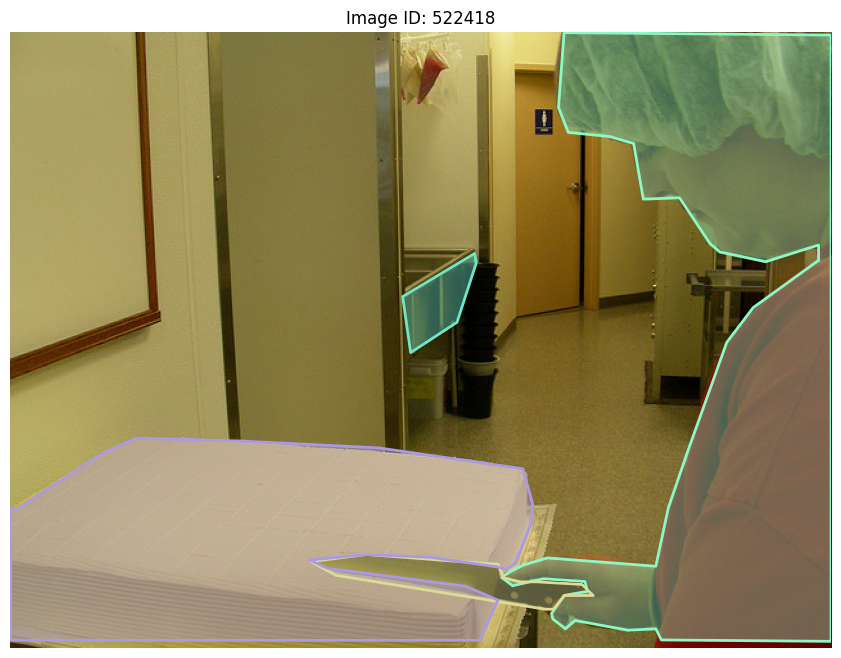


📸 Captions for Image ID 184613:
  1. A child holding a flowered umbrella and petting a yak.
  2. A young man holding an umbrella next to a herd of cattle.
  3. a young boy barefoot holding an umbrella touching the horn of a cow
  4. A young boy with an umbrella who is touching the horn of a cow.
  5. A boy holding an umbrella while standing next to livestock.


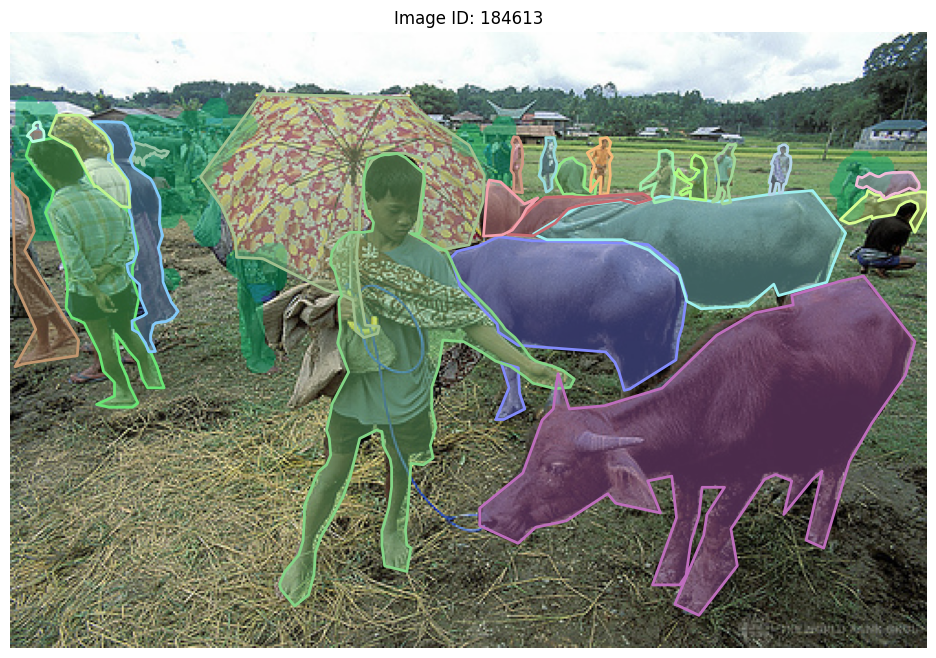


📸 Captions for Image ID 318219:
  1. A young boy standing in front of a computer keyboard.
  2. a little boy wearing headphones and looking at a computer monitor
  3. He is listening intently to the computer at school.
  4. A young boy stares up at the computer monitor.
  5. a young kid with head phones on using a computer 


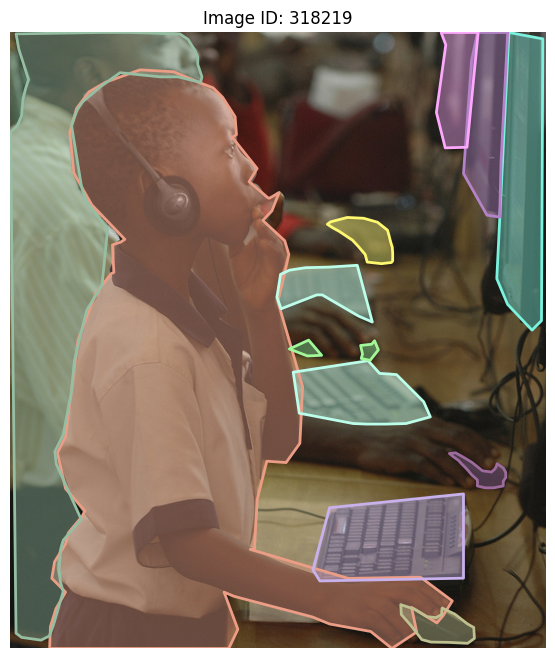


📸 Captions for Image ID 554625:
  1. a boy wearing headphones using one computer in a long row of computers
  2. A little boy with earphones on listening to something.
  3. A group of people sitting at desk using computers.
  4. Children sitting at computer stations on a long table.
  5. A small child wearing headphones plays on the computer.


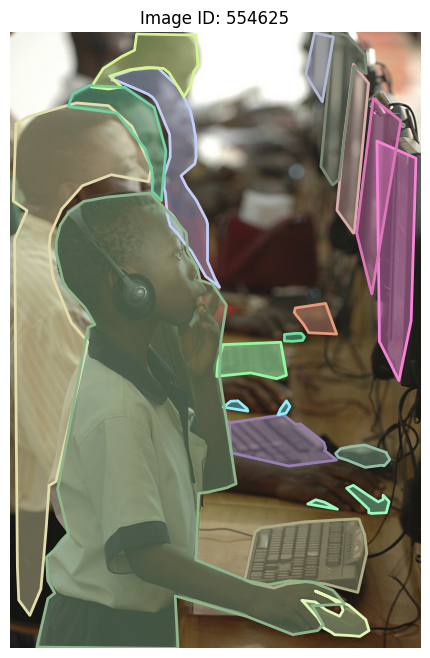


📸 Captions for Image ID 574769:
  1. A woman in a room with a cat.
  2. A girl smiles as she holds a cat and wears a brightly colored skirt.
  3. a woman is holding a cat in her kitchen
  4. A woman is working in a kitchen carrying a soft toy.
  5. A woman is holding a cat in her kitchen.


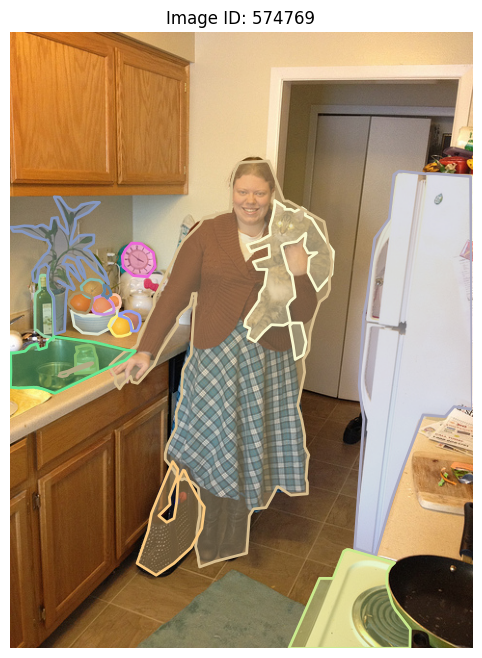


📸 Captions for Image ID 60623:
  1. A young girl inhales with the intent of blowing out a candle. 
  2. A young girl is preparing to blow out her candle.
  3. A kid is to blow out the single candle in a bowl of birthday goodness. 
  4. Girl blowing out the candle on an ice-cream 
  5. A little girl is getting ready to blow out a candle on a small dessert.


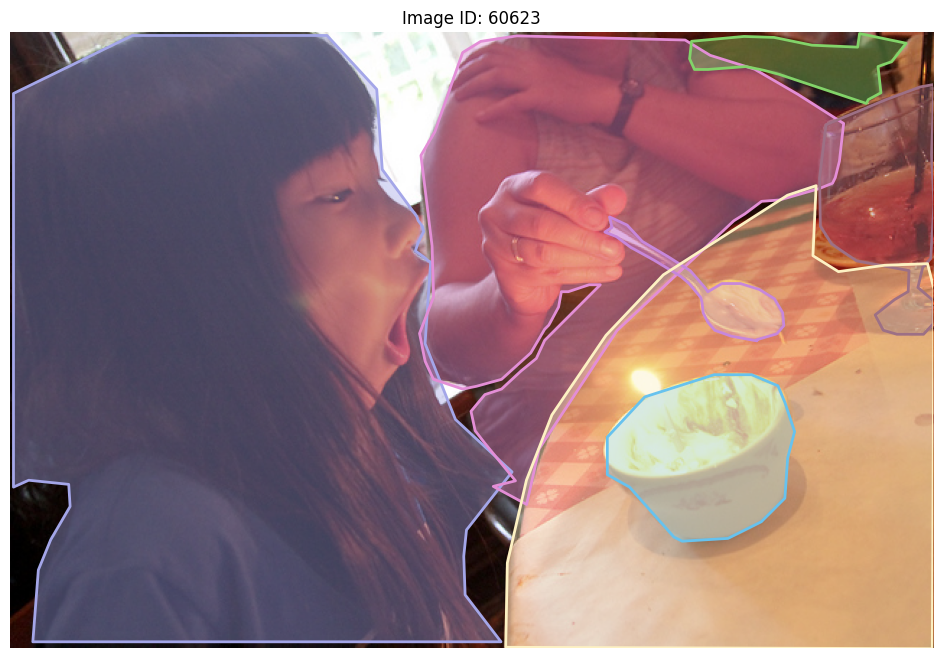


📸 Captions for Image ID 309022:
  1. A commercial stainless kitchen with a pot of food cooking. 
  2. Some food sits in a pot in a kitchen. 
  3. A kitchen has all stainless steel appliances and counters.
  4. a kitchen with a sink and many cooking machines and a pot of food
  5. Food cooks in a pot on a stove in a kitchen.


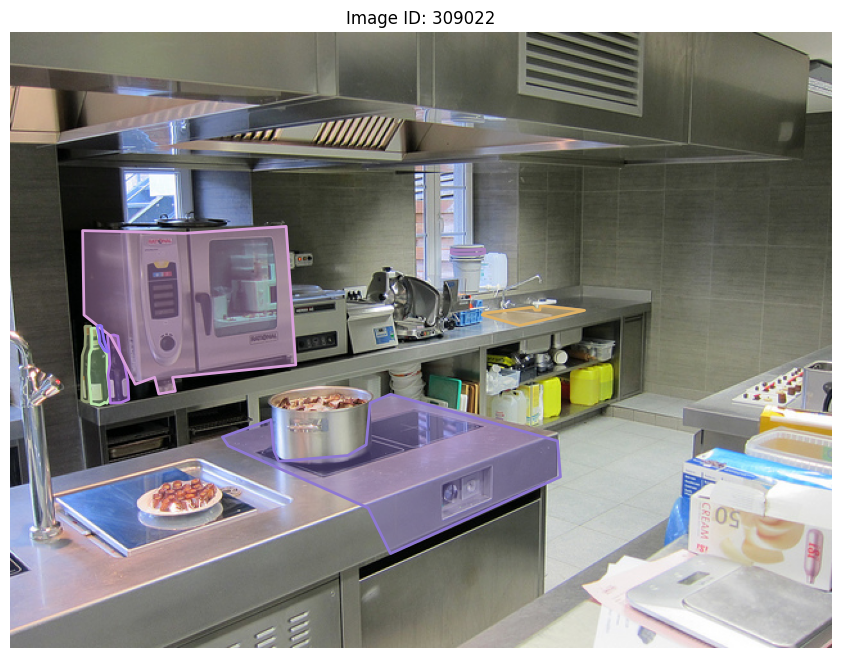


📸 Captions for Image ID 5802:
  1. Two men wearing aprons working in a commercial-style kitchen.
  2. Chefs preparing food in a professional metallic style kitchen.
  3. Two people standing around in a large kitchen.
  4. A commercial kitchen with two men working to prepare several plates.
  5. two men in white shirts in a large steel kitchen


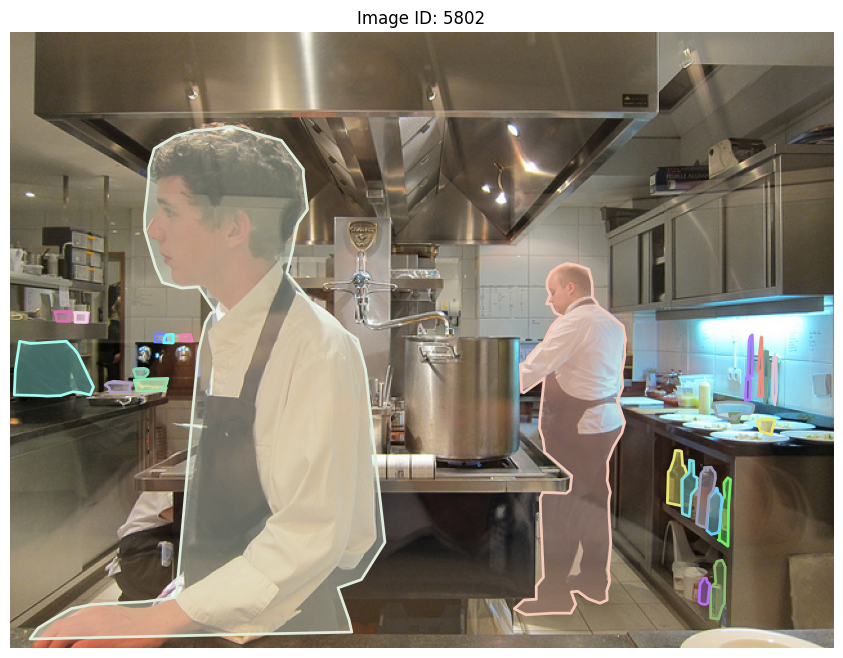


📸 Captions for Image ID 222564:
  1. Two chefs in a restaurant kitchen preparing food. 
  2. Two cooks are cooking the food someone ordered at this restaurant
  3. The chef is cooking with pans on the stove next to an oven. 
  4. Two men that are standing in a kitchen.
  5. Two cooks are near the stove in a stainless steel kitchen.


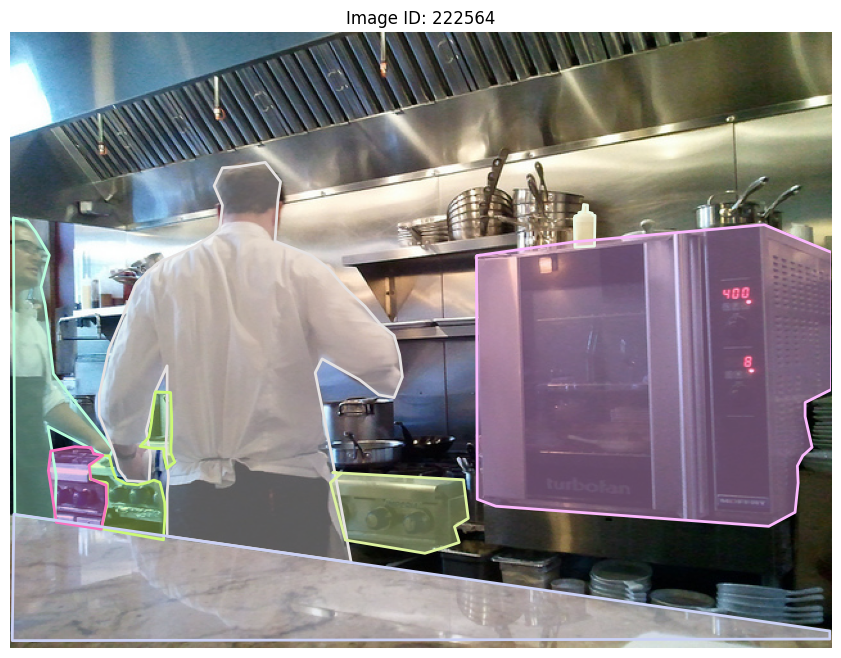

In [ ]:
from pycocotools.coco import COCO
import matplotlib.pyplot as plt
import skimage.io as io
import os

# Paths
ann_file = '/content/coco_ann2017/annotations/instances_train2017.json'
img_dir = '/content/coco_train2017/train2017'

# Load COCO annotations
coco_instances = COCO(ann_file)
caption_ann_file = '/content/coco_ann2017/annotations/captions_train2017.json'
coco_captions = COCO(caption_ann_file)
# Get image IDs
img_ids = coco_instances.getImgIds()

# Show first 5 images
for img_id in img_ids[:10]:
    # Load image metadata
    img_info = coco_instances.loadImgs(img_id)[0]
    img_path = os.path.join(img_dir, img_info['file_name'])

    # Load image
    image = io.imread(img_path)

    # Plot image
    plt.figure(figsize=(20, 8))
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"Image ID: {img_id}")

    # Show annotations (bounding boxes, masks, etc.)
    ann_ids = coco_instances.getAnnIds(imgIds=img_id)
    anns = coco_instances.loadAnns(ann_ids)
    coco_instances.showAnns(anns)

    # Get and display captions
    caption_ids = coco_captions.getAnnIds(imgIds=img_id)
    caption_anns = coco_captions.loadAnns(caption_ids)
    captions = [ann['caption'] for ann in caption_anns]

    if captions:
        print(f"\n📸 Captions for Image ID {img_id}:")
        for i, cap in enumerate(captions):
            print(f"  {i+1}. {cap}")
    else:
        print("\n(No captions found)")

    plt.show()


In [ ]:
image_ids = coco.getImgIds()
print("Total images:", len(image_ids))

# Load a random image info
import random
img_id = random.choice(image_ids)
img_info = coco.loadImgs(img_id)[0]
print("Image Info:", img_info)

Total images: 118287
Image Info: {'license': 1, 'file_name': '000000024823.jpg', 'coco_url': 'http://images.cocodataset.org/train2017/000000024823.jpg', 'height': 439, 'width': 640, 'date_captured': '2013-11-14 16:51:53', 'flickr_url': 'http://farm7.staticflickr.com/6099/6340142655_79a9f1faec_z.jpg', 'id': 24823}


In [ ]:
import collections

category_counts = collections.Counter()
for img_id in image_ids:
    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)
    for ann in anns:
        category_counts[ann['category_id']] += 1

# Print the top categories
for cat_id, count in category_counts.most_common(10):
    cat_name = coco.loadCats(cat_id)[0]['name']
    print(f"{cat_name}: {count}")

person: 262465
car: 43867
chair: 38491
book: 24715
bottle: 24342
cup: 20650
dining table: 15714
bowl: 14358
traffic light: 12884
handbag: 12354


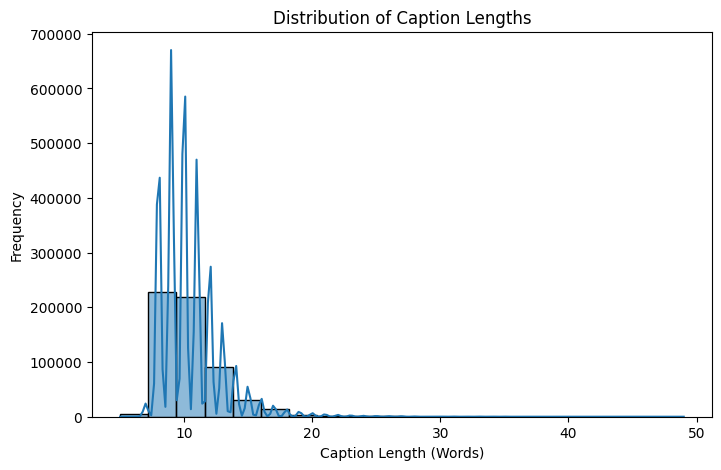

In [ ]:
import seaborn as sns

# Get all caption annotations
caption_anns = coco_captions.loadAnns(coco_captions.getAnnIds())

# Compute caption lengths (in words)
caption_lengths = [len(ann['caption'].split()) for ann in caption_anns]

# Plot distribution
plt.figure(figsize=(8, 5))
sns.histplot(caption_lengths, bins=20, kde=True)
plt.xlabel("Caption Length (Words)")
plt.ylabel("Frequency")
plt.title("Distribution of Caption Lengths")
plt.show()


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


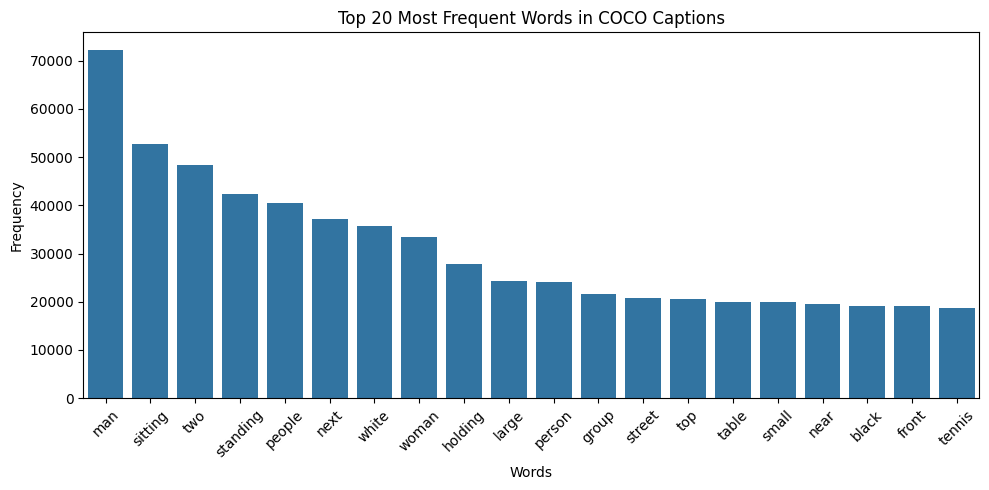

In [ ]:
from collections import Counter
import nltk
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.corpus import stopwords
# Make sure stopwords are downloaded
nltk.download("stopwords")

# Set of English stopwords
stop_words = set(stopwords.words("english"))

# Get all COCO captions
caption_anns = coco_captions.loadAnns(coco_captions.getAnnIds())

# Extract and clean words
all_words = []
for ann in caption_anns:
    words = ann['caption'].lower().split()
    all_words.extend([word for word in words if word.isalpha() and word not in stop_words])

# Count top 20 words
word_counts = Counter(all_words)
top_words = word_counts.most_common(20)

# Plot
plt.figure(figsize=(10, 5))
sns.barplot(x=[word[0] for word in top_words], y=[word[1] for word in top_words])
plt.xticks(rotation=45)
plt.xlabel("Words")
plt.ylabel("Frequency")
plt.title("Top 20 Most Frequent Words in COCO Captions")
plt.tight_layout()
plt.show()


In [ ]:
vocab_size = len(word_counts)
print(f"Vocabulary Size: {vocab_size}")

Vocabulary Size: 24529


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


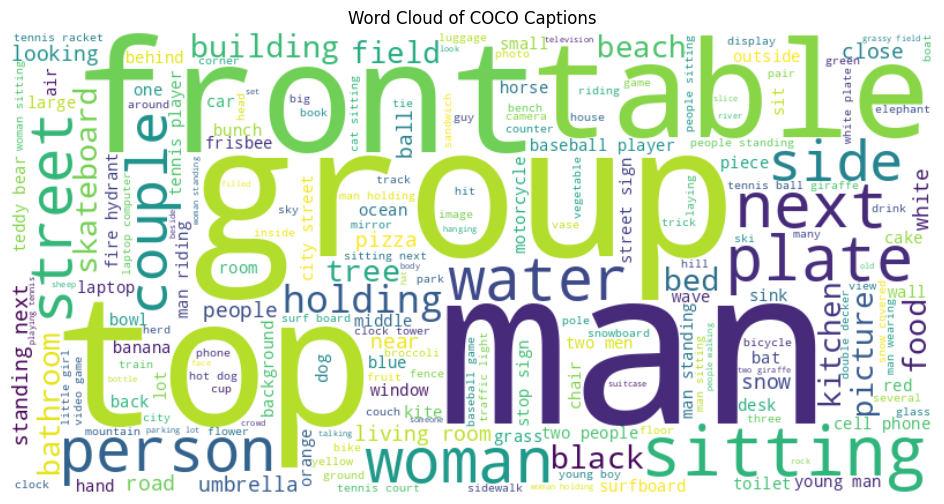

In [ ]:
from wordcloud import WordCloud
import nltk

# Make sure stopwords are ready
nltk.download('stopwords')
from nltk.corpus import stopwords

stop_words = set(stopwords.words("english"))

# Collect all caption words
all_captions_text = " ".join(
    ann["caption"].lower() for ann in coco_captions.loadAnns(coco_captions.getAnnIds())
)

# Create the word cloud
wordcloud = WordCloud(
    width=800,
    height=400,
    background_color="white",
    stopwords=stop_words,
    collocations=True
).generate(all_captions_text)

# Display the word cloud
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud of COCO Captions")
plt.show()

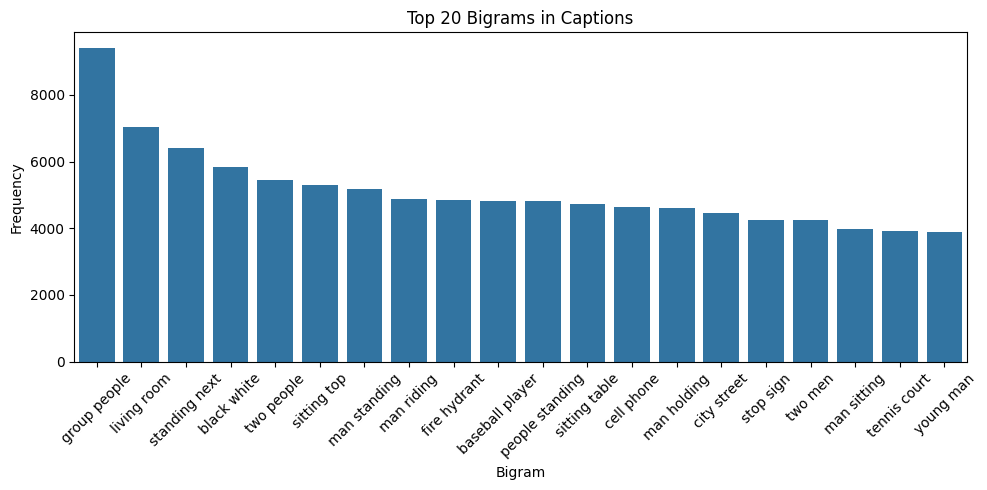

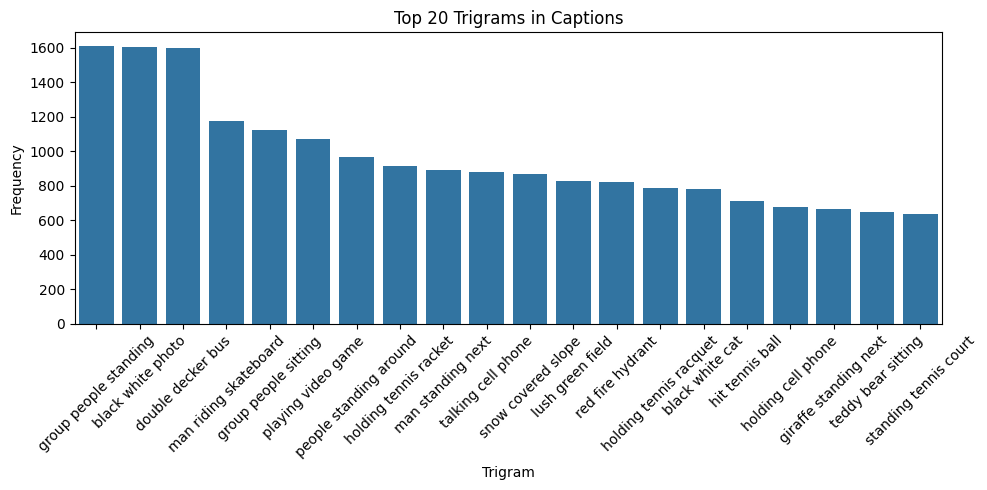

In [ ]:
from nltk.util import ngrams
from collections import Counter
import re

# Clean and tokenize all captions
tokens = []
for ann in coco_captions.loadAnns(coco_captions.getAnnIds()):
    caption = ann['caption'].lower()
    caption = re.sub(r'[^a-z\s]', '', caption)  # Remove punctuation
    words = [word for word in caption.split() if word not in stop_words]
    tokens.append(words)

# Flatten token list
flat_tokens = [word for caption in tokens for word in caption]

# Extract bigrams and trigrams
bigrams = list(ngrams(flat_tokens, 2))
trigrams = list(ngrams(flat_tokens, 3))

# Count and get top ones
top_bigrams = Counter(bigrams).most_common(20)
top_trigrams = Counter(trigrams).most_common(20)

# Plot Top Bigrams
plt.figure(figsize=(10, 5))
sns.barplot(x=[" ".join(bg[0]) for bg in top_bigrams], y=[bg[1] for bg in top_bigrams])
plt.xticks(rotation=45)
plt.title("Top 20 Bigrams in Captions")
plt.xlabel("Bigram")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

# Plot Top Trigrams
plt.figure(figsize=(10, 5))
sns.barplot(x=[" ".join(tg[0]) for tg in top_trigrams], y=[tg[1] for tg in top_trigrams])
plt.xticks(rotation=45)
plt.title("Top 20 Trigrams in Captions")
plt.xlabel("Trigram")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()


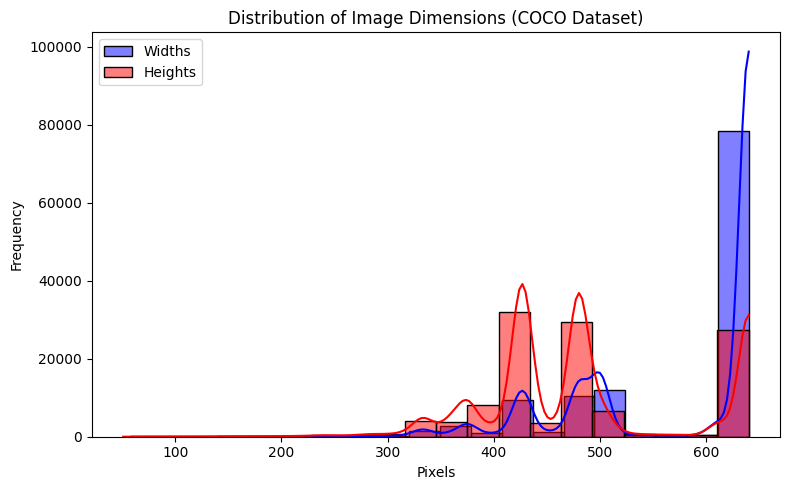

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Get all image metadata
image_infos = coco_instances.loadImgs(coco_instances.getImgIds())

# Extract width and height for each image
widths = [img['width'] for img in image_infos]
heights = [img['height'] for img in image_infos]

# Plot the distributions
plt.figure(figsize=(8, 5))
sns.histplot(widths, bins=20, kde=True, label="Widths", color="blue")
sns.histplot(heights, bins=20, kde=True, label="Heights", color="red")
plt.xlabel("Pixels")
plt.ylabel("Frequency")
plt.title("Distribution of Image Dimensions (COCO Dataset)")
plt.legend()
plt.tight_layout()
plt.show()

loading annotations into memory...
Done (t=60.94s)
creating index...
index created!


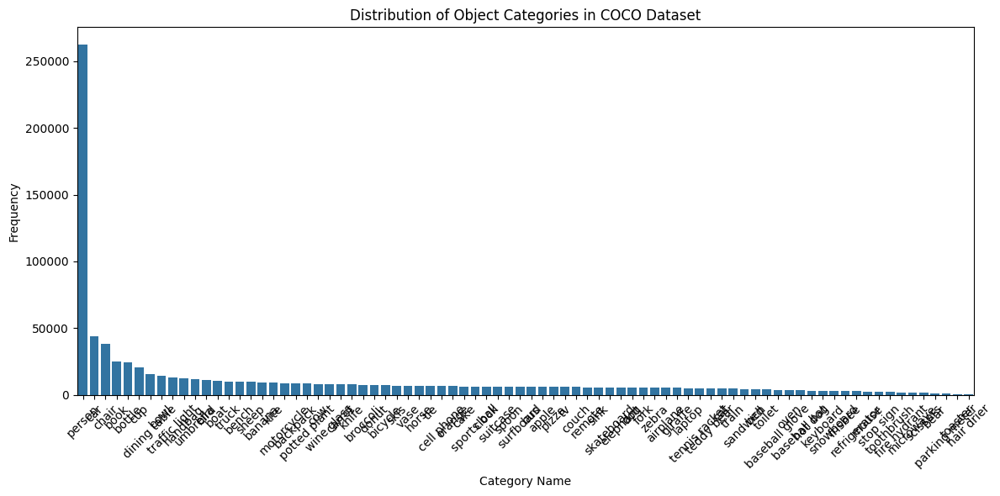

In [ ]:
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
from pycocotools.coco import COCO

# Load the annotation file using COCO API
ann_file = "/content/coco_ann2017/annotations/instances_train2017.json"
coco = COCO(ann_file)

# Get all annotations
ann_ids = coco.getAnnIds()
anns = coco.loadAnns(ann_ids)

# Count category IDs
category_counts = Counter([ann["category_id"] for ann in anns])

# Get mapping from category ID to name
cat_id_to_name = {cat["id"]: cat["name"] for cat in coco.loadCats(coco.getCatIds())}

# Convert to name-based count
name_counts = {cat_id_to_name[cat_id]: count for cat_id, count in category_counts.items()}

# Sort by frequency
sorted_items = sorted(name_counts.items(), key=lambda x: x[1], reverse=True)
labels, values = zip(*sorted_items)

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(x=list(labels), y=list(values))
plt.xticks(rotation=45)
plt.xlabel("Category Name")
plt.ylabel("Frequency")
plt.title("Distribution of Object Categories in COCO Dataset")
plt.tight_layout()
plt.show()


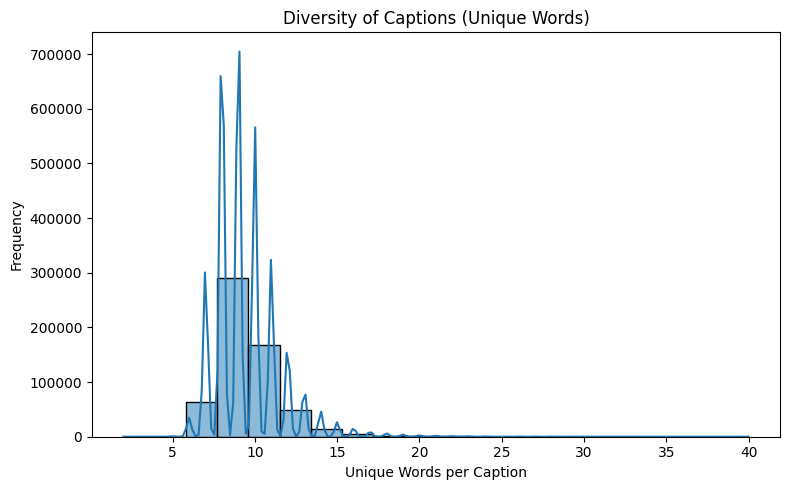

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Load all captions
caption_anns = coco_captions.loadAnns(coco_captions.getAnnIds())

# Compute number of unique words in each caption
unique_words_per_caption = [
    len(set(ann['caption'].lower().split())) for ann in caption_anns
]

# Plot histogram
plt.figure(figsize=(8, 5))
sns.histplot(unique_words_per_caption, bins=20, kde=True)
plt.xlabel("Unique Words per Caption")
plt.ylabel("Frequency")
plt.title("Diversity of Captions (Unique Words)")
plt.tight_layout()
plt.show()